<a href="https://colab.research.google.com/github/SophiaES/Test/blob/main/%EC%BB%B4%ED%93%A8%ED%84%B0AI%EA%B3%B5%ED%95%99%EA%B3%BC_%EC%9D%B4%EC%9D%80%EC%84%A0_3%EA%B0%95%EC%8B%A4%EC%8A%B5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

실습3_이미지프로세싱의 기초2

01 스레시홀딩(Thresholding, 임계처리)

01.1 기본 스레시홀딩(Simple Thresholding)

Parameters:

retVal - 스레시홀딩에 사용한 경계값을 반환
result - 스레시홀딩 이미지 결과값
sourceImage – 스레시홀딩을 할 이미지
threshVal - 스레시홀딩에 사용한 경계값
maxVal - 경계값을 넘을 때 매기는 임의의 값
thresholdType - 스레시홀딩 타입

01.2 기본 스레시홀딩 옵션 비교하기

In [14]:
#구글 드라이브 마운트 하기
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


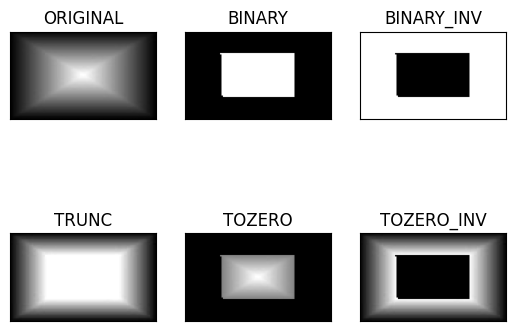

In [15]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
from matplotlib import pyplot as plt

image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/photos/gradientImages/gradient_rectangular.jpg', cv2.IMREAD_GRAYSCALE)

retVal,thresh1 = cv2.threshold(image,127,255,cv2.THRESH_BINARY)
retVal,thresh2 = cv2.threshold(image,127,255,cv2.THRESH_BINARY_INV)
retVal,thresh3 = cv2.threshold(image,127,255,cv2.THRESH_TRUNC)
retVal,thresh4 = cv2.threshold(image,127,255,cv2.THRESH_TOZERO)
retVal,thresh5 = cv2.threshold(image,127,255,cv2.THRESH_TOZERO_INV)

imageList = {'ORIGINAL':image,'BINARY':thresh1,'BINARY_INV':thresh2,'TRUNC':thresh3,'TOZERO':thresh4,'TOZERO_INV':thresh5}

for i, (key,value) in enumerate(imageList.items()):
  plt.subplot(2,3,i+1)
  plt.imshow(value, cmap='gray')
  plt.xticks([]),plt.yticks([])
  plt.title(key)

plt.savefig("figure1", transparent=True)
plt.show()

01.3 다양한 경계값에 따른 스레시홀딩 이미지

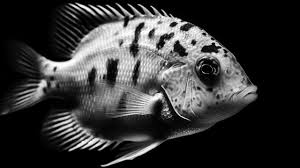

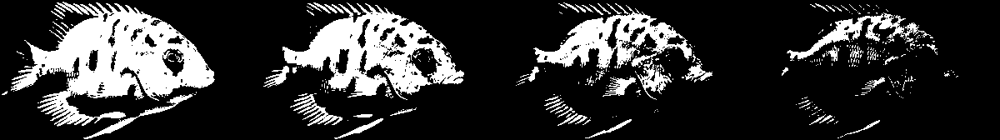

In [17]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

imagePath ='/content/drive/MyDrive/Colab Notebooks/photos/fish.jpg'
grayImage = cv2.imread(imagePath, cv2.IMREAD_GRAYSCALE)

_, thresh1 = cv2.threshold(grayImage, 50, 255, cv2.THRESH_BINARY)
_, thresh2 = cv2.threshold(grayImage, 100, 255, cv2.THRESH_BINARY)
_, thresh3 = cv2.threshold(grayImage, 150, 255, cv2.THRESH_BINARY)
_, thresh4 = cv2.threshold(grayImage, 200, 255, cv2.THRESH_BINARY)


cv2_imshow(grayImage)
mask_frame = cv2.hconcat([thresh1, thresh2, thresh3, thresh4])
cv2_imshow(mask_frame)

01.4 오츠의 이진화 알고리즘(Otsu's Binarization)

OTSU: 88.0


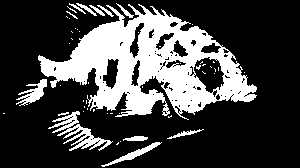

In [18]:
retVal, otsuImage = cv2.threshold(grayImage, 0, 255, cv2.THRESH_OTSU)

print("OTSU:", retVal)
cv2_imshow(otsuImage)

01.5 적응형 스레시홀딩(Adaptive thresholding)

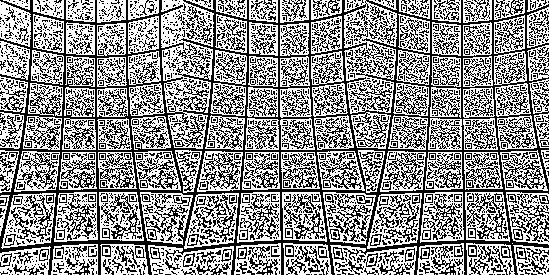

In [22]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

imagePath ='/content/drive/MyDrive/Colab Notebooks/photos/QRimages.jpg'
grayImage = cv2.imread(imagePath, cv2.IMREAD_GRAYSCALE)

ret,thresh127 = cv2.threshold(grayImage,127,255,cv2.THRESH_BINARY)
adaptiveMean = cv2.adaptiveThreshold(grayImage,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,7,7)
adaptiveGaussian = cv2.adaptiveThreshold(grayImage,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,7,7)

adaptive = cv2.hconcat([thresh127, adaptiveMean, adaptiveGaussian])
cv2_imshow(adaptive)

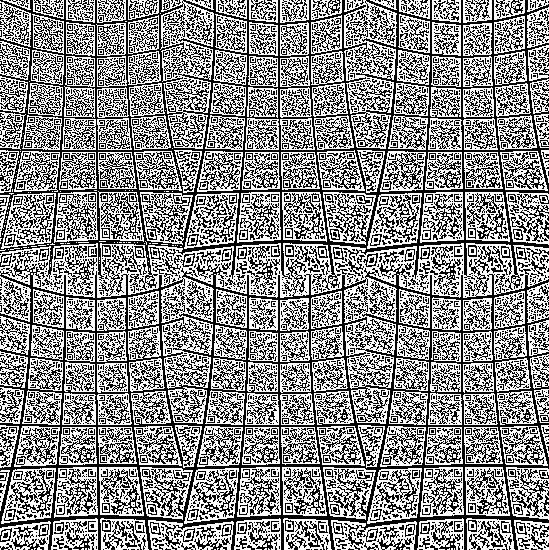

In [23]:
adaptiveMean1 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5)
adaptiveMean2 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 5)
adaptiveMean3 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 7, 5)
adaptiveMean4 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 5)
adaptiveMean5 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 5)
adaptiveMean6 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, 5)

adaptiveMeanImages1 = cv2.hconcat([adaptiveMean1, adaptiveMean2, adaptiveMean3])
adaptiveMeanImages2 = cv2.hconcat([adaptiveMean4, adaptiveMean5, adaptiveMean6])
adaptiveMeanImages = cv2.vconcat([adaptiveMeanImages1, adaptiveMeanImages2])

cv2_imshow(adaptiveMeanImages)

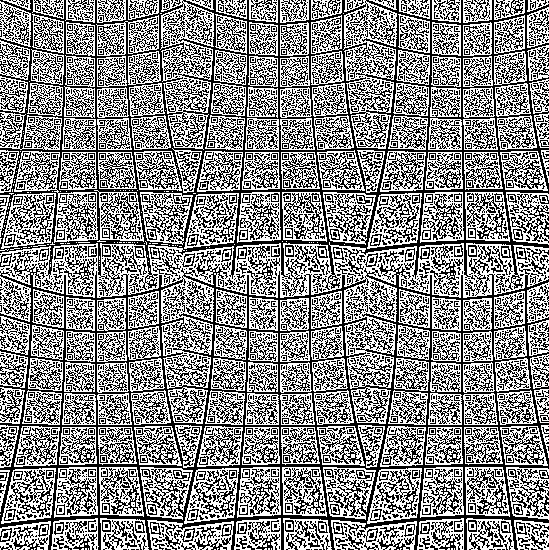

In [24]:
adaptiveGaussian1 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 3, 5)
adaptiveGaussian2 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 5, 5)
adaptiveGaussian3 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 7, 5)
adaptiveGaussian4 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 9, 5)
adaptiveGaussian5 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 5)
adaptiveGaussian6 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 13, 5)

adaptiveGaussianImages1 = cv2.hconcat([adaptiveGaussian1, adaptiveGaussian2, adaptiveGaussian3])
adaptiveGaussianImages2 = cv2.hconcat([adaptiveGaussian4, adaptiveGaussian5, adaptiveGaussian6])

adaptiveGaussianImages = cv2.vconcat([adaptiveGaussianImages1, adaptiveGaussianImages2])
cv2_imshow(adaptiveGaussianImages)

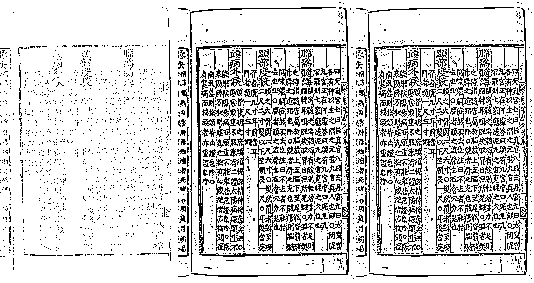

In [26]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

imagePath ='/content/drive/MyDrive/Colab Notebooks/photos/scannedimage.jpg'
grayImage = cv2.imread(imagePath, cv2.IMREAD_GRAYSCALE)

ret,thresh127 = cv2.threshold(grayImage,127,255,cv2.THRESH_BINARY)
adaptiveMean = cv2.adaptiveThreshold(grayImage,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,7,7)
adaptiveGaussian = cv2.adaptiveThreshold(grayImage,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,7,7)

adaptive = cv2.hconcat([thresh127, adaptiveMean, adaptiveGaussian])
cv2_imshow(adaptive)

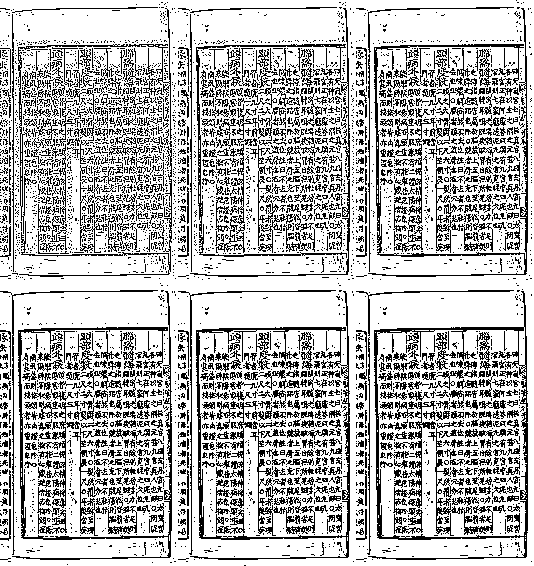

In [27]:
adaptiveMean1 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 3, 5)
adaptiveMean2 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 5)
adaptiveMean3 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 7, 5)
adaptiveMean4 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 5)
adaptiveMean5 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 5)
adaptiveMean6 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, 5)

adaptiveMeanImages1 = cv2.hconcat([adaptiveMean1, adaptiveMean2, adaptiveMean3])
adaptiveMeanImages2 = cv2.hconcat([adaptiveMean4, adaptiveMean5, adaptiveMean6])
adaptiveMeanImages = cv2.vconcat([adaptiveMeanImages1, adaptiveMeanImages2])

cv2_imshow(adaptiveMeanImages)

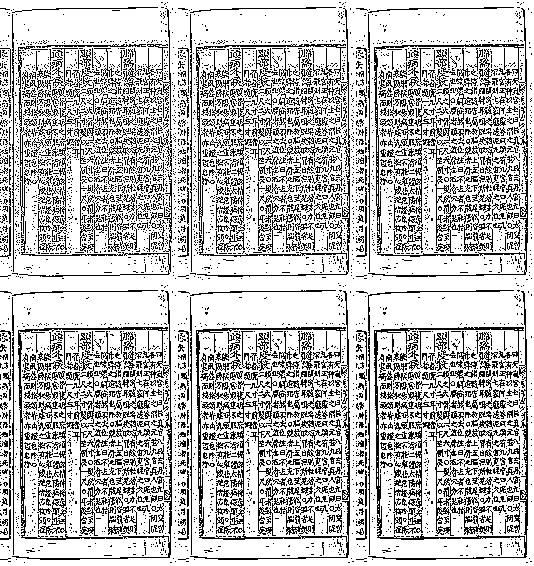

In [28]:
adaptiveGaussian1 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 3, 5)
adaptiveGaussian2 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 5, 5)
adaptiveGaussian3 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 7, 5)
adaptiveGaussian4 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 9, 5)
adaptiveGaussian5 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 5)
adaptiveGaussian6 = cv2.adaptiveThreshold(grayImage, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 13, 5)

adaptiveGaussianImages1 = cv2.hconcat([adaptiveGaussian1, adaptiveGaussian2, adaptiveGaussian3])
adaptiveGaussianImages2 = cv2.hconcat([adaptiveGaussian4, adaptiveGaussian5, adaptiveGaussian6])

adaptiveGaussianImages = cv2.vconcat([adaptiveGaussianImages1, adaptiveGaussianImages2])
cv2_imshow(adaptiveGaussianImages)

01.6 컬러 이미지 스레시홀딩

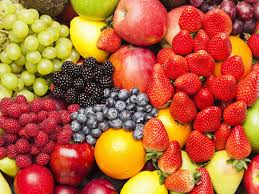

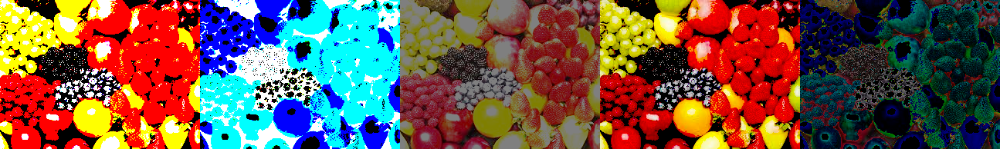

In [29]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow


imagePath ='/content/drive/MyDrive/Colab Notebooks/photos/fruits.jpg'
img = cv2.imread(imagePath)

ret, thresh1 = cv2.threshold(img,127,255, cv2.THRESH_BINARY)
ret, thresh2 = cv2.threshold(img,127,255, cv2.THRESH_BINARY_INV)
ret, thresh3 = cv2.threshold(img,127,255, cv2.THRESH_TRUNC)
ret, thresh4 = cv2.threshold(img,127,255, cv2.THRESH_TOZERO)
ret, thresh5 = cv2.threshold(img,127,255, cv2.THRESH_TOZERO_INV)

cv2_imshow(img)
image_frame = cv2.hconcat([thresh1,thresh2,thresh3,thresh4,thresh5])
cv2_imshow(image_frame)

02 이미지연산

02.1 Numpy와 OpenCV의 연산비교

In [30]:
import numpy as np
import cv2

a = np.uint8([[10,200,50]])
b = np.uint8([[250,100,100]])

addCV = cv2.add(a,b)
subCV = cv2.subtract(a,b)
mulCV = cv2.multiply(a,3)
divCV = cv2.divide(a,3)

addNP = a+b
subNP = a-b
mulNP = a*3
divNP = a/3

print("CV: ",addCV, subCV, mulCV, divCV)
print("NP: ",addNP, subNP, mulNP, divNP)

CV:  [[255 255 150]] [[  0 100   0]] [[ 30 255 150]] [[ 3 67 17]]
NP:  [[  4  44 150]] [[ 16 100 206]] [[ 30  88 150]] [[ 3.33333333 66.66666667 16.66666667]]


02.2 이미지 연산

In [31]:
#구글 드라이브 마운트 하기
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


원본 이미지


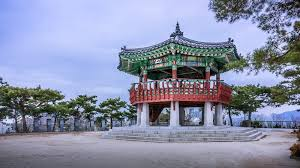

CV: Add, Sub, Mul, Div


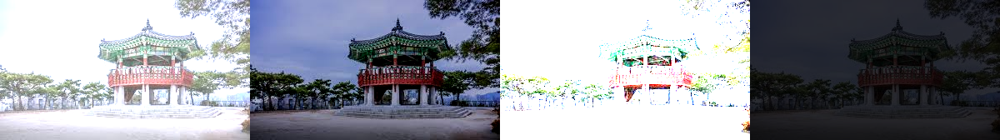

In [32]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath ='/content/drive/MyDrive/Colab Notebooks/photos/building.jpg' #이미지의 위치로 변경
image = cv2.imread(imagePath).astype(np.uint8)

print("원본 이미지")
cv2_imshow(image)

#이미지와 같은 사이즈의 Numpy 배열을 만들고, 100와 50으로 채움
add100 = np.full(image.shape, 100, np.uint8)
subtract50 = np.full(image.shape, 50, np.uint8)
multiply5 = np.full(image.shape, 5, np.uint8)
divide5 = np.full(image.shape, 5, np.uint8)

#CV 이미지 연산
addCV = cv2.add(image, add100)
subtractCV = cv2.subtract(image, subtract50)
multiplyCV = cv2.multiply(image, multiply5)
divideCV = cv2.divide(image, divide5)

CV_frame = cv2.hconcat([addCV,subtractCV,multiplyCV,divideCV])
print("CV: Add, Sub, Mul, Div")
cv2_imshow(CV_frame)

uint8 uint8 uint8 float64
uint8 uint8 uint8 uint8
NP: Add, Sub, Mul, Div


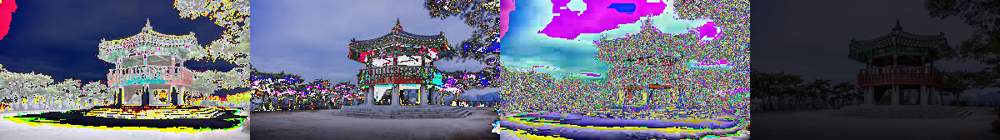

In [33]:
#NP 이미지 연산
addNP = image + add100
subtractNP = image - subtract50
multiplyNP = image * multiply5
divideNP = image / divide5

#cv2.hconcat오류해결: 소수점을 정수 uint8 자료형으로 변환
print(subtractNP.dtype, addNP.dtype, multiplyNP.dtype, divideNP.dtype)
divideNP = divideNP.astype('uint8')
print(subtractNP.dtype, addNP.dtype, multiplyNP.dtype, divideNP.dtype)


NP_frame = cv2.hconcat([addNP,subtractNP,multiplyNP,divideNP])
print("NP: Add, Sub, Mul, Div")
cv2_imshow(NP_frame)

Add, Sub, Mul, Div


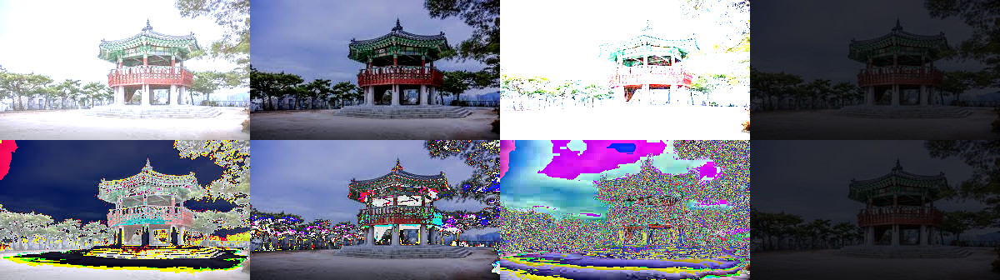

True

In [34]:
Compare_frame = cv2.vconcat((CV_frame,NP_frame))
print("Add, Sub, Mul, Div")
cv2_imshow(Compare_frame)

cv2.imwrite("CV_image.jpg", CV_frame)
cv2.imwrite("NP_image.jpg", NP_frame)

02.3 두 이미지 합과 차

원본 이미지


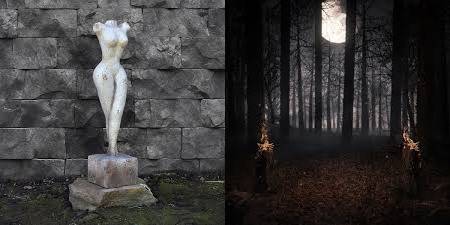

CV: Add, Sub


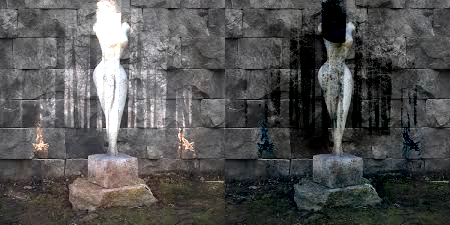

NP: Add, Sub


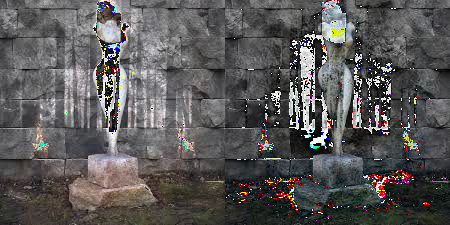

In [39]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/statue.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/nightforest.jpg'
image1 = cv2.imread(imagePath1)
image2 = cv2.imread(imagePath2)

print("원본 이미지")
image_frame = cv2.hconcat([image1,image2])
cv2_imshow(image_frame)


#OpenCV 연산
CVaddImages = cv2.add(image1,image2)
CVsubImages = cv2.subtract(image1,image2)

print("CV: Add, Sub")
CVimage_frame = cv2.hconcat([CVaddImages,CVsubImages])
cv2_imshow(CVimage_frame)


#Nympy 연산
NPaddImages = image1+image2
NPsubImages = image1-image2

print("NP: Add, Sub")
NPimage_frame = cv2.hconcat([NPaddImages,NPsubImages])
cv2_imshow(NPimage_frame)

02.4 가중치 블랜딩

사진1, 사진2, 가중치 블랜딩, 직접구현


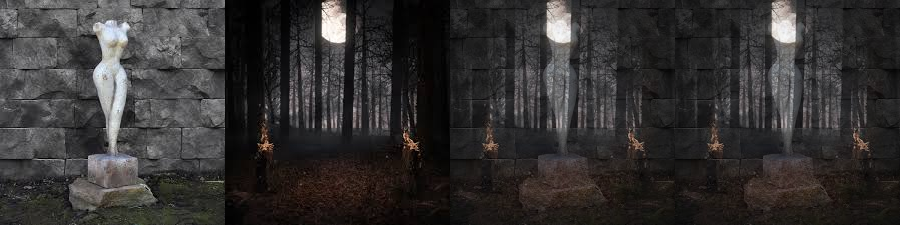

In [40]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/statue.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/nightforest.jpg'
image1 = cv2.imread(imagePath1)
image2 = cv2.imread(imagePath2)

alpha = 0.3

#가중치 블랜딩 함수
dst = cv2.addWeighted(image1,alpha,image2,(1-alpha),0)

#직접 연산
blended = image1*alpha + image2*(1-alpha)
blended = blended.astype(np.uint8)

print("사진1, 사진2, 가중치 블랜딩, 직접구현")
Weighted_frame = cv2.hconcat([image1,image2,dst,blended])
cv2_imshow(Weighted_frame)

02.5 이미지의 뺄셈연산과 차이미지(image differencing)

image1, image2, subtract(img1,img2), subtract(img2,img1) 


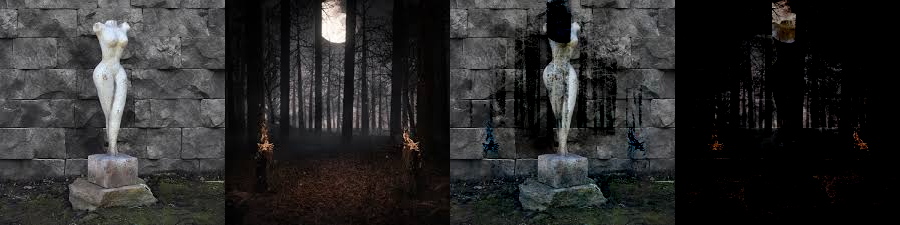



image1, image2, absdiff(img1,img2), absdiff(img2,img1) 


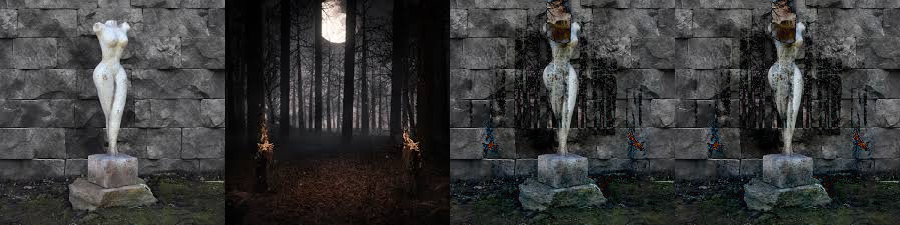

In [41]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/statue.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/nightforest.jpg'
image1 = cv2.imread(imagePath1)
image2 = cv2.imread(imagePath2)

#뺼셈 연산
print("image1, image2, subtract(img1,img2), subtract(img2,img1) ")
diff1 = cv2.subtract(image1,image2)
diff2 = cv2.subtract(image2,image1)

image_frame = cv2.hconcat([image1,image2,diff1,diff2])
cv2_imshow(image_frame)

print("\n")

#절대값 차이
print("image1, image2, absdiff(img1,img2), absdiff(img2,img1) ")
absDiff1 = cv2.absdiff(image1,image2)
absDiff2 = cv2.absdiff(image2,image1)

image_frame = cv2.hconcat([image1,image2,absDiff1,absDiff2])
cv2_imshow(image_frame)

02.6 차이미지와 스레시홀딩을 사용해 틀린그림 찾기I

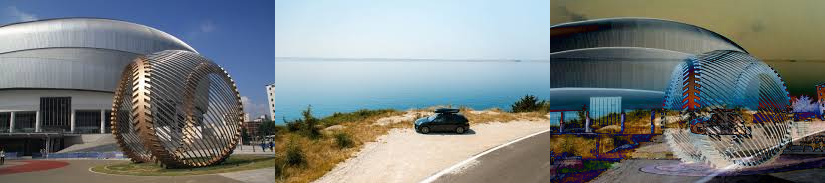

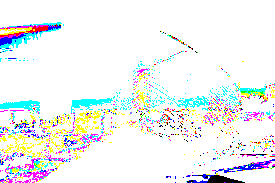

In [44]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/findDiff2-1.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/findDiff2-2.jpg'

#RGB 색상 이미지
image1 = cv2.imread(imagePath1)
image2 = cv2.imread(imagePath2)

#RGB 색상 이미지 차
imageDiff = cv2.absdiff(image1,image2)
_, imageDiff_t = cv2.threshold(imageDiff, 10, 255, cv2.THRESH_BINARY)

image_frame = cv2.hconcat([image1,image2,imageDiff])
cv2_imshow(image_frame)
cv2_imshow(imageDiff_t)

02.7 비트와이즈 연산(bitwise-operation)

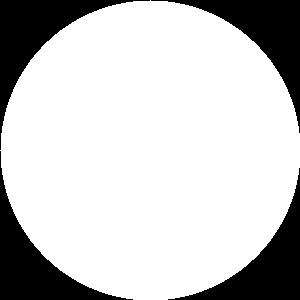

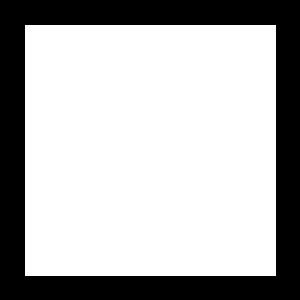

사각형과 원 이미지


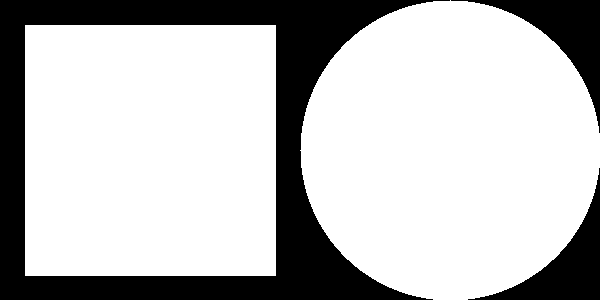

비트와이즈 연산: And, Or, Xor, Not


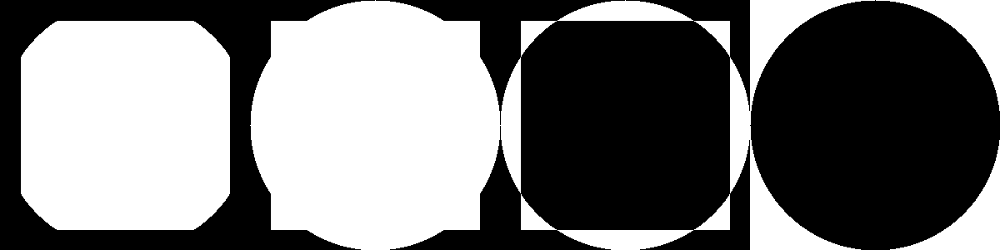

In [45]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

#사각형 이미지 생성
rectangle = np.zeros((300, 300), dtype = "uint8")
cv2.rectangle(rectangle, (25, 25), (275, 275), 255, -1)

#원 이미지 생성
circle = np.zeros((300, 300), dtype = "uint8")
cv2.circle(circle, (150, 150), 150, 255, -1)

cv2_imshow(circle)
cv2_imshow(rectangle)

print("사각형과 원 이미지")
shape_frame = cv2.hconcat([rectangle,circle])
cv2_imshow(shape_frame)

#비트와이즈 연산
bitwiseAnd = cv2.bitwise_and(circle,rectangle)
bitwiseOr = cv2.bitwise_or(circle,rectangle)
bitwiseXor = cv2.bitwise_xor(circle,rectangle)
bitwiseNot = cv2.bitwise_not(circle)

print("비트와이즈 연산: And, Or, Xor, Not")
bitwise_frame = cv2.hconcat([bitwiseAnd,bitwiseOr,bitwiseXor,bitwiseNot])
cv2_imshow(bitwise_frame)

원본 이미지


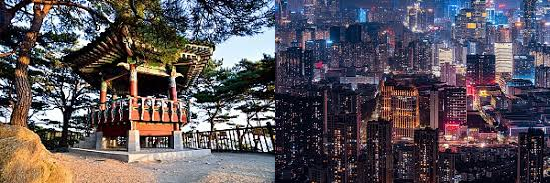

AND, OR, XOR, NOT


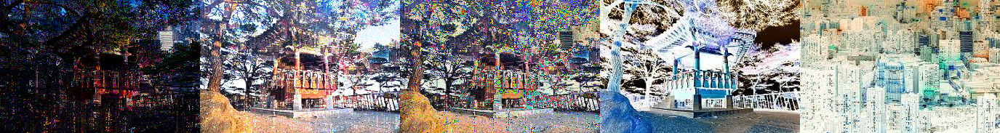

In [57]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 = '/content/drive/MyDrive/Colab Notebooks/photos/building1-1.jpg'
imagePath2 = '/content/drive/MyDrive/Colab Notebooks/photos/nightcity.jpg'
image1 = cv2.imread(imagePath1)
image2 = cv2.imread(imagePath2)

print("원본 이미지")
image_frame = cv2.hconcat([image1, image2])
cv2_imshow(image_frame)

#마스크 옵션을 사용할 경우, 마스크 이미지 위의 픽셀만 확인한다.
andImage = cv2.bitwise_and(image1, image2)
orImage = cv2.bitwise_or(image1, image2)
xorImage = cv2.bitwise_xor(image1, image2)
notImage1 = cv2.bitwise_not(image1)
notImage2 = cv2.bitwise_not(image2)

print("AND, OR, XOR, NOT")
mask_frame = cv2.hconcat([andImage,orImage,xorImage,notImage1,notImage2])
cv2_imshow(mask_frame)

02.8 차이미지와 비트연산자를 사용해 틀린그림 찾기II

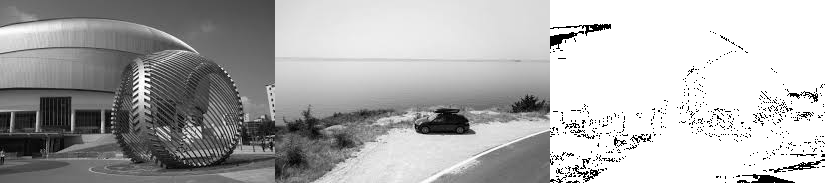

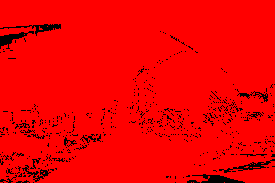

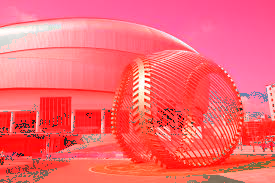

In [60]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/findDiff2-1.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/findDiff2-2.jpg'

#RGB 색상 이미지
image1 = cv2.imread(imagePath1)
image2 = cv2.imread(imagePath2)

#RGB 색상 이미지를 그레이스케일로 변환
grayImage1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
grayImage2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)

#그레이스케일 이미지 차
imageDiff = cv2.absdiff(grayImage1, grayImage2)
_, imageDiff = cv2.threshold(imageDiff, 10, 255, cv2.THRESH_BINARY)
colorDiff = cv2.cvtColor(imageDiff, cv2.COLOR_GRAY2BGR)
colorDiff[:,:,:2] = 0
spot = cv2.bitwise_or(image1, colorDiff)

grayImage_frame = cv2.hconcat([grayImage1,grayImage2,imageDiff])
cv2_imshow(grayImage_frame)

cv2_imshow(colorDiff)
cv2_imshow(spot)

03 이미지 마스크(Image Mask)

2D 마스크 그림


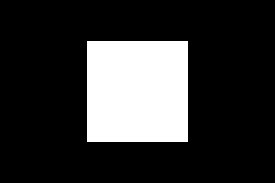

원본 이미지


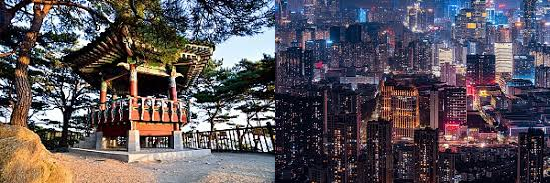

In [61]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 = '/content/drive/MyDrive/Colab Notebooks/photos/building1-1.jpg'
imagePath2 = '/content/drive/MyDrive/Colab Notebooks/photos/nightcity.jpg'
image1 = cv2.imread(imagePath1)
image2 = cv2.imread(imagePath2)


#비트와이즈 2D 마스크 만들기
maskImage2D = np.zeros(image1.shape[:2], np.uint8)
(centerX, centerY) = (image1.shape[1]//2, image1.shape[0]//2)
cv2.rectangle(maskImage2D,(centerX-50, centerY-50),(centerX+50,centerY+50),255,-1)

print("2D 마스크 그림")
cv2_imshow(maskImage2D)

print("원본 이미지")
image_frame = cv2.hconcat([image1, image2])
cv2_imshow(image_frame)

두 이미지의 OpenCV의 덧셈,뺄셈과 마스크 효과를 추가한 이미지


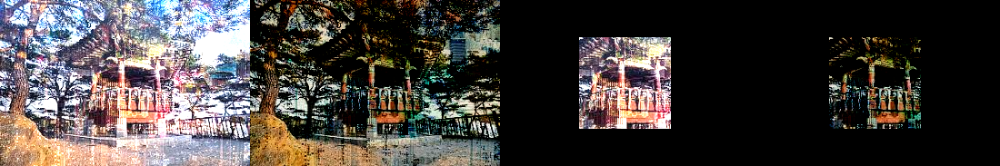

In [62]:
#두 이미지의 OpenCV 덧셈,뺼셈
addImage = cv2.add(image1, image2)
subImage = cv2.subtract(image1, image2)

#두 이미지의 마스크를 사용한 OpenCV 덧셈,뺄셈
addMask = cv2.add(image1, image2, mask=maskImage2D)
subMask = cv2.subtract(image1, image2, mask=maskImage2D)

print("두 이미지의 OpenCV의 덧셈,뺄셈과 마스크 효과를 추가한 이미지")
mask_frame = cv2.hconcat([addImage, subImage, addMask, subMask])
cv2_imshow(mask_frame)

2D 마스크 효과 이미지


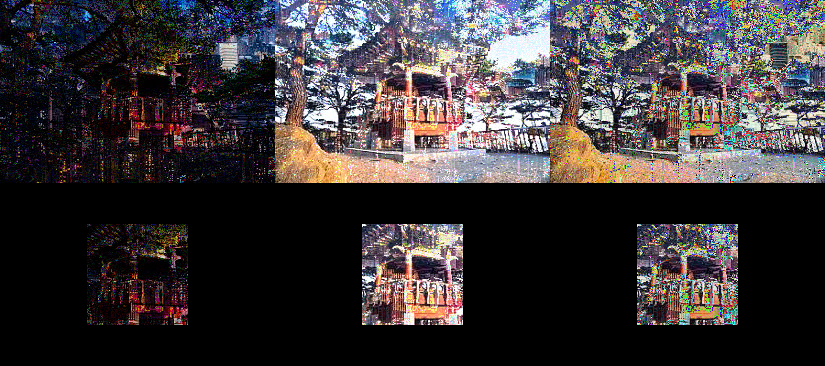

In [63]:
#두 이미지의 비트와이즈 AND,OR,XOR 연산
andImage = cv2.bitwise_and(image1, image2)
orImage = cv2.bitwise_or(image1, image2)
xorImage = cv2.bitwise_xor(image1, image2)

#두 이미지의 비트와이즈 AND,OR,XOR 연산에 마스크 추가
andMask = cv2.bitwise_and(image1, image2, mask=maskImage2D)
orMask = cv2.bitwise_or(image1, image2, mask=maskImage2D)
xorMask = cv2.bitwise_xor(image1, image2, mask=maskImage2D)

print("2D 마스크 효과 이미지")
image_frame = cv2.hconcat([andImage,orImage,xorImage])
mask_frame = cv2.hconcat([andMask,orMask,xorMask])
result_frame = cv2.vconcat([image_frame,mask_frame])
cv2_imshow(result_frame)

2D 마스크 효과 이미지


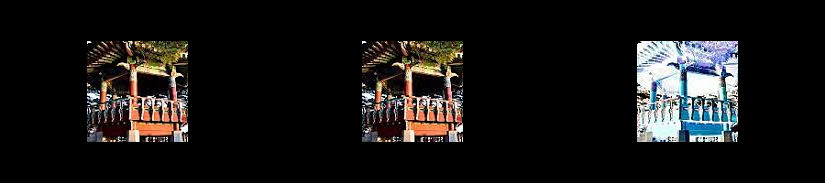

In [64]:
#한 이미지의 비트와이즈 AND,OR,NOT 연산에 마스크 추가
andMask = cv2.bitwise_and(image1, image1, mask=maskImage2D)
orMask = cv2.bitwise_or(image1, image1, mask=maskImage2D)
notMask = cv2.bitwise_not(image1, mask=maskImage2D)

print("2D 마스크 효과 이미지")
mask_frame = cv2.hconcat([andMask,orMask,notMask])
cv2_imshow(mask_frame)

04 마스크와 스레시홀딩을 활용한 이미지 합성

04.1 알파 채널 마스크와 스레시홀딩을 사용한 이미지 합성

원본 이미지: PNG 포멧의 RGBA이미지와 JPG포멧의 RGB 이미지


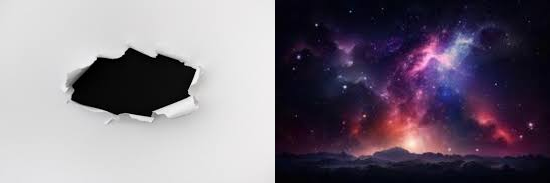

In [73]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/paperhole.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/nightsky.jpg'

paperLayer = cv2.imread(imagePath1, cv2.IMREAD_UNCHANGED)
bgLayer = cv2.imread(imagePath2)

print("원본 이미지: PNG 포멧의 RGBA이미지와 JPG포멧의 RGB 이미지")
image_frame = cv2.hconcat([paperLayer[:,:,:3], bgLayer])
cv2_imshow(image_frame)

PNG 이미지의 알파값으로 만든 마스크와 반전마스크


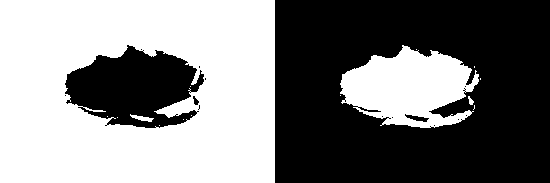

In [77]:
#알파채널을 사용해서 마스크와 반전마스크 생성
_, mask = cv2.threshold(paperLayer[:,:,2],200,255,cv2.THRESH_BINARY)
invertedMask = cv2.bitwise_not(mask)

print("PNG 이미지의 알파값으로 만든 마스크와 반전마스크")
mask_frame = cv2.hconcat([mask,invertedMask])
cv2_imshow(mask_frame)

PNG 이미지의 알파값으로 만든 마스크를 적용한 종이이미지와 반전마스크를 적용한 배경 이미지의 합성


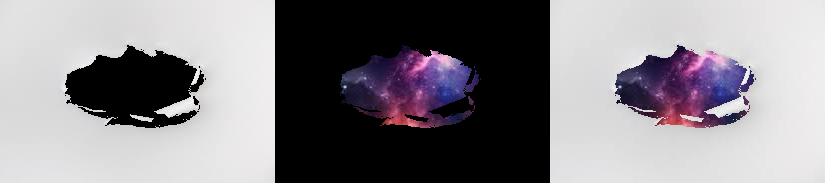

In [78]:
#BRGA이미지를 BGR이미지로 변환
paperLayer = cv2.cvtColor(paperLayer, cv2.COLOR_BGRA2BGR)

#paperLayer에 마스크합성
paperImage = cv2.bitwise_and(paperLayer,paperLayer,mask=mask)
bgImage = cv2.bitwise_and(bgLayer,bgLayer,mask=invertedMask)
mergedImage = paperImage + bgImage

print("PNG 이미지의 알파값으로 만든 마스크를 적용한 종이이미지와 반전마스크를 적용한 배경 이미지의 합성")
mask_frame = cv2.hconcat([paperImage,bgImage,mergedImage])
cv2_imshow(mask_frame)

04.2 ROI를 설정해 알파채널 이미지 합성하기

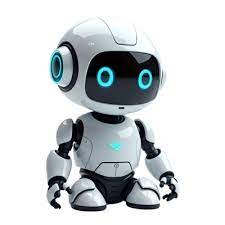

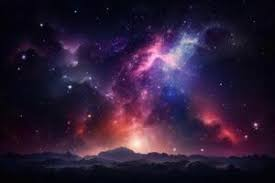

In [79]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/robot.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/nightsky.jpg'
robotImage = cv2.imread(imagePath1, cv2.IMREAD_UNCHANGED)
nightImage = cv2.imread(imagePath2)

cv2_imshow(robotImage)
cv2_imshow(nightImage)

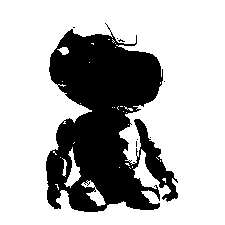

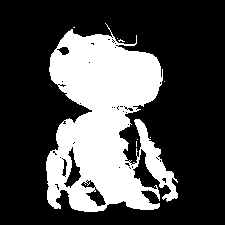

In [81]:
#알파채널을 사용해서 로봇이미지의 마스크와 반전마스크 생성
ret, robotMask = cv2.threshold(robotImage[:,:,2],200,255,cv2.THRESH_BINARY)
invertedMask = cv2.bitwise_not(robotMask)
cv2_imshow(robotMask)
cv2_imshow(invertedMask)

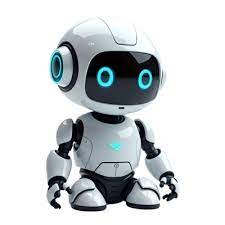

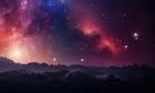

In [82]:
#BGRA인 로봇이미지를 BGR컬러이미지로 변환 후 크기에 맞게 ROI 잘라내기
robotImage = cv2.cvtColor(robotImage, cv2.COLOR_BGRA2BGR)
height, width = robotImage.shape[:2]
ROI = nightImage[90:90+height,120:120+width]

cv2_imshow(robotImage)
cv2_imshow(ROI)

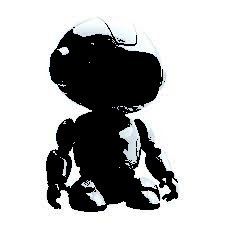

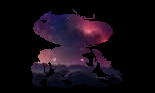

In [88]:
import cv2

# 1. robotMask, invertedMask 크기 맞추기
robotMask_resized = cv2.resize(robotMask, (robotImage.shape[1], robotImage.shape[0]))
invertedMask_resized = cv2.resize(invertedMask, (ROI.shape[1], ROI.shape[0]))

# 2. 마스크 타입 맞추기 (uint8)
if robotMask_resized.dtype != 'uint8':
    robotMask_resized = robotMask_resized.astype('uint8')
if invertedMask_resized.dtype != 'uint8':
    invertedMask_resized = invertedMask_resized.astype('uint8')

# 3. 마스크가 3채널 이상이면 1채널로 변환
if len(robotMask_resized.shape) == 3:
    robotMask_resized = cv2.cvtColor(robotMask_resized, cv2.COLOR_BGR2GRAY)
if len(invertedMask_resized.shape) == 3:
    invertedMask_resized = cv2.cvtColor(invertedMask_resized, cv2.COLOR_BGR2GRAY)

# 4. 마스크 적용
maskedRobotImage = cv2.bitwise_and(robotImage, robotImage, mask=robotMask_resized)
maskedROIImage = cv2.bitwise_and(ROI, ROI, mask=invertedMask_resized)

# 5. 출력
cv2_imshow(maskedRobotImage)
cv2_imshow(maskedROIImage)

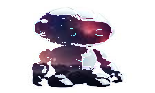

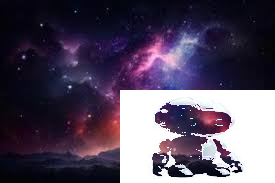

In [97]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

imagePath1 ='/content/drive/MyDrive/Colab Notebooks/photos/robot.jpg'
imagePath2 ='/content/drive/MyDrive/Colab Notebooks/photos/nightsky.jpg'
robotImage = cv2.imread(imagePath1, cv2.IMREAD_UNCHANGED)
nightImage = cv2.imread(imagePath2)

# Check if images were loaded successfully
if robotImage is None:
    print(f"Error: Unable to load robot image from {imagePath1}")
elif nightImage is None:
    print(f"Error: Unable to load night sky image from {imagePath2}")
else:
    #알파채널을 사용해서 로봇이미지의 마스크와 반전마스크 생성
    # Ensure robotImage has an alpha channel if it's a PNG
    if robotImage.shape[2] == 4:
        ret, robotMask = cv2.threshold(robotImage[:,:,3],200,255,cv2.THRESH_BINARY)
    else:
        # If not PNG, create a mask based on grayscale
        gray_robot = cv2.cvtColor(robotImage, cv2.COLOR_BGR2GRAY)
        ret, robotMask = cv2.threshold(gray_robot, 200, 255, cv2.THRESH_BINARY)

    invertedMask = cv2.bitwise_not(robotMask)

    #BGRA인 로봇이미지를 BGR컬러이미지로 변환
    if robotImage.shape[2] == 4:
        robotImage = cv2.cvtColor(robotImage, cv2.COLOR_BGRA2BGR)

    # Determine ROI size based on robot image size and ensure it's within nightImage bounds
    height, width = robotImage.shape[:2]
    roi_y = 90
    roi_x = 120

    # Adjust ROI to fit within nightImage dimensions
    roi_height = min(height, nightImage.shape[0] - roi_y)
    roi_width = min(width, nightImage.shape[1] - roi_x)

    if roi_height <= 0 or roi_width <= 0:
        print("Error: ROI is outside of night sky image bounds.")
    else:
        ROI = nightImage[roi_y : roi_y + roi_height, roi_x : roi_x + roi_width]

        # 1. robotMask, invertedMask 크기 맞추기
        # Resize masks to match the dimensions of the ROI
        robotMask_resized = cv2.resize(robotMask, (roi_width, roi_height))
        invertedMask_resized = cv2.resize(invertedMask, (roi_width, roi_height))

        # 2. 마스크 타입 맞추기 (uint8) - already done by thresholding
        # 3. 마스크가 3채널 이상이면 1채널로 변환 - already done for mask and invertedMask

        # 4. 마스크 적용
        # Resize robotImage to match the ROI size before applying the mask
        robotImage_resized = cv2.resize(robotImage, (roi_width, roi_height))
        maskedRobotImage = cv2.bitwise_and(robotImage_resized, robotImage_resized, mask=robotMask_resized)
        maskedROIImage = cv2.bitwise_and(ROI, ROI, mask=invertedMask_resized)

        # 5. 합성이미지
        #로봇이미지와 ROI 이미지를 합성 후 밤하늘 이미지에 추가
        robotROI = cv2.add(maskedRobotImage, maskedROIImage) # Use cv2.add for summing with proper handling
        nightImage[roi_y : roi_y + roi_height, roi_x : roi_x + roi_width] = robotROI

        cv2_imshow(robotROI)
        cv2_imshow(nightImage)

04.3 HSV 컬러 범위로 스레시홀딩 후 이미지 마스킹하기

In [98]:
import cv2
import numpy as np

red = np.uint8([[[0,0,255]]])
yellow = np.uint8([[[0,255,255]]])
green = np.uint8([[[0,255,0]]])
blue = np.uint8([[[255,0,0]]])

hsv_red = cv2.cvtColor(red,cv2.COLOR_BGR2HSV)
hsv_yellow = cv2.cvtColor(yellow,cv2.COLOR_BGR2HSV)
hsv_green = cv2.cvtColor(green,cv2.COLOR_BGR2HSV)
hsv_blue = cv2.cvtColor(blue,cv2.COLOR_BGR2HSV)

print(hsv_red,hsv_yellow,hsv_green,hsv_blue)

[[[  0 255 255]]] [[[ 30 255 255]]] [[[ 60 255 255]]] [[[120 255 255]]]


In [99]:
h,s,v = hsv_yellow[0,0,:]

lower_bound = [h-10,50,50]
upper_bound = [h+10,255,255]

print(lower_bound)
print(upper_bound)

[np.uint8(20), 50, 50]
[np.uint8(40), 255, 255]


04.4 HSV 컬러필터 만들기

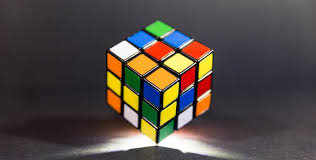

In [101]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

image = cv2.imread("/content/drive/MyDrive/Colab Notebooks/photos/cube.jpg")
cv2_imshow(image)

In [105]:
#HSV 이미지로 변환
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)

#색상별 영역 지정
blue1 = np.array([110, 50, 50])
blue2 = np.array([130, 255,255])

green1 = np.array([50, 50, 50])
green2 = np.array([70, 255, 255])

red1 = np.array([0,50,50])
red2 = np.array([10,255,255])
red3 = np.array([170,50,50])
red4 = np.array([179,255,255])

yellow1 = np.array([20,50,50])
yellow2 = np.array([40,255,255])

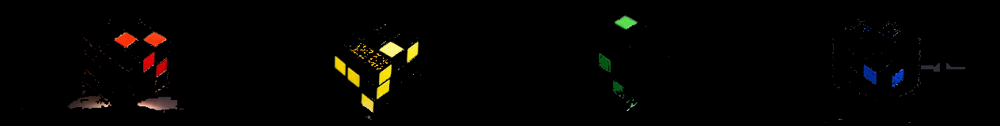

In [106]:
#HSV 컬러 마스크 생성
mask_blue = cv2.inRange(hsv, blue1, blue2)
mask_green = cv2.inRange(hsv, green1, green2)
mask_red1 = cv2.inRange(hsv, red1, red2)
mask_red2 = cv2.inRange(hsv, red3, red4)
mask_yellow = cv2.inRange(hsv, yellow1, yellow2)


#색상별 마스크로 해당 색상만 추출
blueImage = cv2.bitwise_and(image, image, mask=mask_blue)
greenImage = cv2.bitwise_and(image, image, mask=mask_green)
yellowImage = cv2.bitwise_and(image, image, mask=mask_yellow)

redHalf1 = cv2.bitwise_and(image, image, mask=mask_red1)
redHalf2 = cv2.bitwise_and(image, image, mask=mask_red2)
redImage = cv2.bitwise_or(redHalf1, redHalf2)


color_frame = cv2.hconcat([redImage,yellowImage,greenImage,blueImage])
cv2_imshow(color_frame)

04.5 HSV 채널 값을 슬라이더로 변경

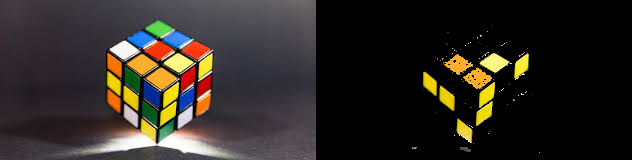

In [114]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

image = cv2.imread("/content/drive/MyDrive/Colab Notebooks/photos/cube.jpg")

hueMin = 18 #@param {type:"slider", min:0, max:179, step:1}
satMin = 32 #@param {type:"slider", min:0, max:255, step:1}
valMin = 48 #@param {type:"slider", min:0, max:255, step:1}
hueMax = 33 #@param {type:"slider", min:0, max:179, step:1}
satMax = 255 #@param {type:"slider", min:0, max:255, step:1}
valMax = 255 #@param {type:"slider", min:0, max:255, step:1}

lower = np.array([hueMin, satMin, valMin])
upper = np.array([hueMax, satMax, valMax])

# Create HSV Image and threshold into a range.
hsvImage = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
mask = cv2.inRange(hsvImage, lower, upper)
result = cv2.bitwise_and(image,image, mask=mask)

color_frame = cv2.hconcat([image,result])
cv2_imshow(color_frame)